# Ideas:
Calculate the difference in pixels for the initial images. Calculate for the left half and generated output. Use 1-1 and 3-1 approaches.

# Customized pix2pix GAN
This notebook is based on the original tensorflow pix2pix GAN: https://www.tensorflow.org/tutorials/generative/pix2pix

In [1]:
import tensorflow as tf
import os
import time
from matplotlib import pyplot as plt
from IPython import display
import numpy as np
from PIL import Image, ImageDraw
import glob
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 14800273171411935894
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 4986830848
locality {
  bus_id: 1
  links {
  }
}
incarnation: 14231539693931808775
physical_device_desc: "device: 0, name: NVIDIA GeForce GTX 1660 Ti, pci bus id: 0000:01:00.0, compute capability: 7.5"
]


## Enable saving to Google Drive if working with colab, to external SSD, or disable if saving locally

In [2]:
def save_to(save = "locally"):
  if save == "colab":
    from google.colab import drive
    drive.mount('/content/drive')
    %cd drive/MyDrive/Colab Notebooks/drones
  elif save == "ssd":
    os.chdir("D:/GanNoMask")

In [3]:
save_to("ssd")

## Download the dataset and set the parameters

In [4]:
BUFFER_SIZE = 3000
BATCH_SIZE = 20
IMG_WIDTH = 256
HALF_WIDTH = 128
IMG_HEIGHT = 256
OUTPUT_CHANNELS = 3
EPOCHS = 1000
imdir = "D:/GanNoMask/fulltrain"

In [5]:
def crop_left_center(imdir):
  for image in os.listdir(imdir):
    im = Image.open(imdir + "/" + image)
    im.crop((0, 0, 128, 256)).save("D:/GanNoMask/leftside/" + image)

In [6]:
def crop_center_right(imdir):
  for image in os.listdir(imdir):
    im = Image.open(imdir + "/" + image)
    im.crop((128, 0, 256, 256)).save("D:/GanNoMask/rightside/" + image)

In [7]:
#crop_left_center(imdir)
#crop_center_right(imdir)

## Load the image from file

In [8]:
def load(image_file):
  image = tf.io.read_file(image_file)
  image = tf.io.decode_png(image)
  w = tf.shape(image)[1]
  real_image = image[:, :w, :]
  real_image = tf.cast(real_image, tf.float32)
  return real_image

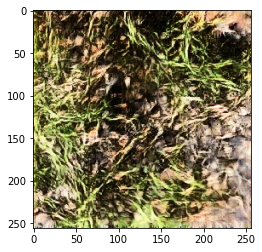

In [9]:
full = load(imdir + "/000000.png")
plt.figure()
plt.imshow(full/255.0)

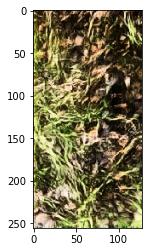

In [10]:
left = load("D:/GanNoMask/leftside/000000.png")
plt.figure()
plt.imshow(left/255.0)

## Random mirroring and jittering of the images

In [11]:
def resize(real_image, height, width):
  real_image = tf.image.resize(real_image, [height, width], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  return real_image

In [12]:
def random_crop(real_image, width):
  cropped_image = tf.image.random_crop(real_image, size=[IMG_HEIGHT, width, 3])
  return cropped_image

In [13]:
def normalize(real_image):
  real_image = (real_image / 127.5) - 1
  return real_image

In [14]:
@tf.function()
def random_jitter(real_image, full):
  if full == True:
  # Resizing to 286 x 286 x 3
    real_image = resize(real_image, 286, 286)
  # Randomly cropping to 256 x 256 x 3
    real_image = random_crop(real_image, IMG_WIDTH)
    if tf.random.uniform(()) > 0.5:
    # Random mirroring
      real_image = tf.image.flip_left_right(real_image)
      
  elif full == False:
    real_image = resize(real_image, 286, 158)
  # Randomly cropping to 256 x 256 x 3
    real_image = random_crop(real_image, HALF_WIDTH)
    if tf.random.uniform(()) > 0.5:
    # Random mirroring
      real_image = tf.image.flip_left_right(real_image)
  return real_image

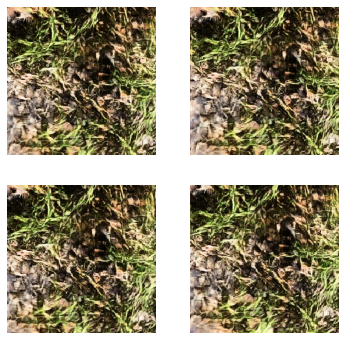

In [15]:
plt.figure(figsize=(6, 6))
for i in range(4):
  rj_re = random_jitter(full, True)
  plt.subplot(2, 2, i+1)
  plt.imshow(rj_re/255.0)
  plt.axis('off')
plt.show()

## Select train and test images

In [16]:
def load_image_train(image_file):
  real_image = load(image_file)
  #real_image = random_jitter(real_image, False)
  real_image = normalize(real_image)
  return real_image

Autotune use may very here depending on the version of tensorflow. The original pix2pix paper uses tensorflow.1.

# FIX RANDOM JITTER!

In [17]:
left_train_set = tf.data.Dataset.list_files("D:/GanNoMask/leftside/*.png", shuffle = False)
right_train_set = tf.data.Dataset.list_files("D:/GanNoMask/rightside/*.png", shuffle = False)
AUTOTUNE = tf.data.experimental.AUTOTUNE
left_train_set = left_train_set.map(load_image_train, num_parallel_calls = AUTOTUNE)
right_train_set = right_train_set.map(load_image_train, num_parallel_calls = AUTOTUNE)
train_dataset = tf.data.Dataset.zip((left_train_set, right_train_set))
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)
len(list(train_dataset))

150

In [18]:
list(train_dataset)

[(<tf.Tensor: shape=(20, 256, 128, 3), dtype=float32, numpy=
  array([[[[-0.09019607, -0.12941176, -0.4980392 ],
           [ 0.09803927,  0.17647064, -0.30196077],
           [ 0.2941177 ,  0.03529418, -0.19999999],
           ...,
           [-0.6627451 , -0.7019608 , -0.9764706 ],
           [ 0.41960788,  0.27843142, -0.14509803],
           [ 0.6862745 ,  0.5137255 ,  0.12941182]],
  
          [[ 0.15294123,  0.09803927, -0.32549018],
           [ 0.45882356,  0.37254906, -0.05098039],
           [ 0.28627455,  0.23921573, -0.15294117],
           ...,
           [-0.32549018, -0.38823527, -0.6392157 ],
           [ 0.60784316,  0.37254906,  0.0196079 ],
           [ 0.43529415,  0.05882359, -0.19215685]],
  
          [[ 0.827451  ,  0.78039217,  0.4039216 ],
           [ 0.73333335,  0.75686276,  0.26274514],
           [ 0.5921569 ,  0.48235297,  0.09019613],
           ...,
           [-0.0745098 ,  0.0196079 , -0.5137255 ],
           [ 0.12156868, -0.18431371, -0.5058824 ],

## Define the downsampling and upsampling
Print the shape of the sample image layer after downsampling and upsampling

In [19]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)
  result = tf.keras.Sequential()
  result.add(tf.keras.layers.Conv2D(filters, 
                                    size, 
                                    strides=2, 
                                    padding='same', 
                                    kernel_initializer=initializer, 
                                    use_bias=False))
  if apply_batchnorm: 
    result.add(tf.keras.layers.BatchNormalization())
  result.add(tf.keras.layers.LeakyReLU())
  return result

In [20]:
down_model = downsample(3, 4)
down_result = down_model(tf.expand_dims(left, 0))
print (down_result.shape)

(1, 128, 64, 3)


In [21]:
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)
  result = tf.keras.Sequential()
  result.add(tf.keras.layers.Conv2DTranspose(filters, 
                                             size, 
                                             strides=2, 
                                             padding='same', 
                                             kernel_initializer=initializer, 
                                             use_bias=False))
  result.add(tf.keras.layers.BatchNormalization())
  if apply_dropout:
    result.add(tf.keras.layers.Dropout(0.5))
  result.add(tf.keras.layers.ReLU())
  return result

In [22]:
up_model = upsample(3, 4)
up_result = up_model(down_result)
print (up_result.shape)

(1, 256, 128, 3)


## Define the Generator. Plot the Generator training pipeline diagram.
Generator uses two inputs: 1-channel random noise vector and vector of x&y coordinates. Then the layers are concatenated. The resulted 3-channel layer is a subject to downsampling, with a following forwarding of the downsampled layer to a skip connection. After the input is fully downsampled, the upsampling begins, with the concatenation of the layers forwarded respectively with skip connection.

In [23]:
def Generator():
  inputs = tf.keras.layers.Input(shape=[256, 128, 3], name='left_half')
  
  down_stack = [
    downsample(64, 4, apply_batchnorm=False),  # (bs, 128, 128, 64)
    downsample(128, 4),  # (bs, 64, 64, 128)
    downsample(256, 4),  # (bs, 32, 32, 256)
    downsample(512, 4),  # (bs, 16, 16, 512)
    downsample(512, 4),  # (bs, 8, 8, 512)
    downsample(512, 4),  # (bs, 4, 4, 512)
    downsample(512, 4),  # (bs, 2, 2, 512)
    #downsample(512, 4),  # (bs, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True),  # (bs, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True),  # (bs, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True),  # (bs, 8, 8, 1024)
    #upsample(512, 4),  # (bs, 16, 16, 1024)
    upsample(256, 4),  # (bs, 32, 32, 512)
    upsample(128, 4),  # (bs, 64, 64, 256)
    upsample(64, 4),  # (bs, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (bs, 256, 256, 3)
  
  x = inputs
  
  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs = inputs, outputs = x)

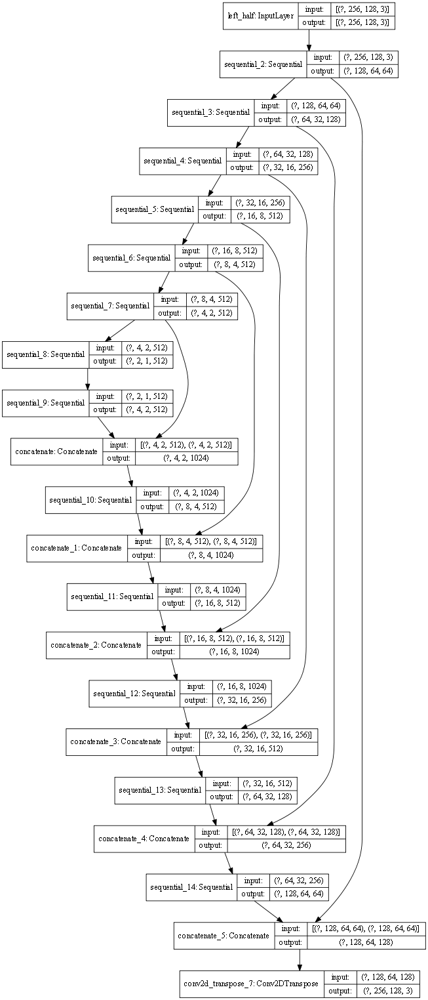

In [24]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

## Plot the Generator output

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


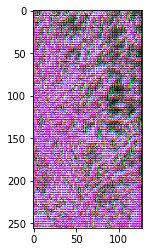

In [25]:
gen_output = generator(left[tf.newaxis, ...], training=False)
plt.imshow(gen_output[0, ...])

## Define the Generator loss

In [26]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [27]:
def generator_loss(disc_generated_output, gen_output):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)
  return gan_loss

## Define the Discriminator. Plot the Discriminator training pipeline diagram.
Use the X&Y coordinates vector and the target image to create the 30x30 patches, which classify the 70x70 portions of the image (PatchGAN).

In [28]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  left = tf.keras.layers.Input(shape=[256, 128, 3], name='left')
  right = tf.keras.layers.Input(shape=[256, 128, 3], name='right')
  
  #concat = tf.keras.layers.concatenate([left, right], axis = 2)  # (bs, 256, 256, channels*2)
  
  #train = tf.keras.layers.Input(shape=[256, 256, 3], name='train')
  
  x = tf.keras.layers.concatenate([left, right]) 

  down1 = downsample(64, 4, False)(x)  # (bs, 128, 128, 64)
  down2 = downsample(128, 4)(down1)  # (bs, 64, 64, 128)
  down3 = downsample(256, 4)(down2)  # (bs, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (bs, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (bs, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)
  
  zero_pad2 = tf.keras.layers.ZeroPadding2D()(zero_pad2)# (bs, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (bs, 30, 30, 1)

  return tf.keras.Model(inputs=[left, right], outputs=last)

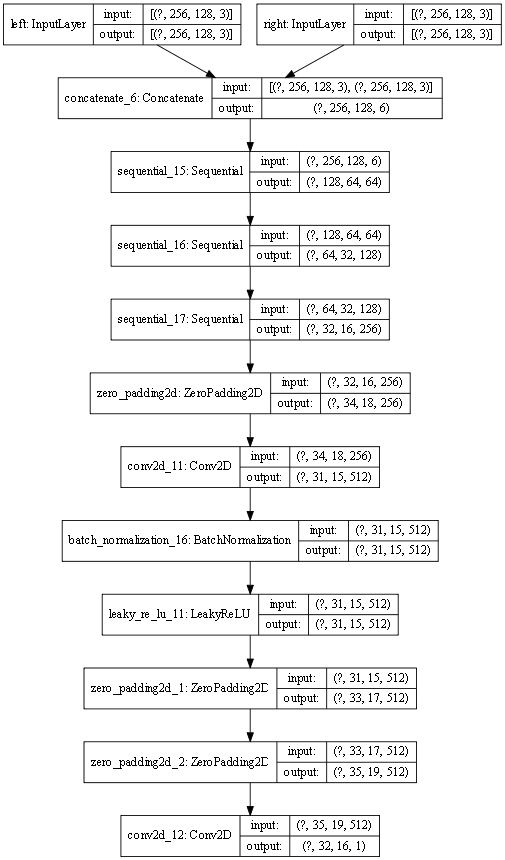

In [29]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

## Plot the patch

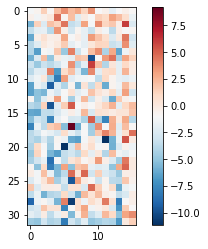

In [30]:
disc_out = discriminator([left[tf.newaxis, ...], gen_output], training=False)
plt.imshow(disc_out[0, ..., -1], cmap='RdBu_r')
plt.colorbar()

## Define discriminator loss

In [31]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

<tf.Tensor: shape=(), dtype=float32, numpy=1.3862944>

Try to replace all with l2 loss

## Create Adam Generator and Discriminator optimizers
Parameters are used from the pix2pix.

In [32]:
def select_optimizer(optimizer):
  if optimizer == "Adam":
    generator_optimizer = tf.keras.optimizers.Adam(5e-5, beta_1 = 0.5, epsilon = 0.01)
    discriminator_optimizer = tf.keras.optimizers.Adam(5e-5, beta_1 = 0.5, epsilon = 0.01)
  elif optimizer == "SGD":
    generator_optimizer = tf.keras.optimizers.SGD(0.005, momentum = 0.9, nesterov = True)
    discriminator_optimizer = tf.keras.optimizers.SGD(0.005, momentum = 0.9, nesterov = True)
  return generator_optimizer, discriminator_optimizer

In [33]:
generator_optimizer = select_optimizer("Adam")[0]
discriminator_optimizer = select_optimizer("Adam")[1]

## Some observations on optimizers
**Adam with 2e-4, beta_1 = 0.5**: Generally, a good default choice. It can be noticed, that the improvements in the predicted image arise when the generator and discriminator losses start fluctuating. This, however, may happend at different point of time. Also, the standard runs are done for 200 epochs, and it may be benefitial to increase the number. <br>
**Adam with epsilon = 0.1 (fit\20210604-101544)**: Both generator and discriminator losses have major fluctuations from the start, which, however, does not lead to the improvement in the prediction image. Potentially needs more runs than 200. <br>
**Adam with epsilon = 0.01 (fit\20210607-152740)**: Seems to recognize shapes quicker than runs with other epsilon values. <br>
**Adam with epsilon = 0.01, beta_1 = 0.35 (fit\20210608-113325)**: "I don't seem to see the difference" (with the above run) - Olli N. <br>
**Adam with 1e-4, epsilon = 0.01 (fit\20210607-152740)**: <br>
**SGD with 0.005, momentum = 0.9, nesterov = True (fit\20210604-095025)**: Generally, Adam is considered a better default choice for the optimizer, as it is more robust towards settings. However, sometimes, stochastic gradient descents, if chosen with correct parameters, can have more precision and speed. But not in this try. <br>
**fit20210614-172200**: 1e-5. images, loop1 gif.
**Custom Adam with complex momentum**: Something to test.

## Create checkpoint and logs savers for later inspection of the predictions and losses
By default, the checkpoint is saved once every 30 epochs.

In [34]:
checkpoint_dir = './training_checkpoints_gan202'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator=generator,
                                 discriminator=discriminator)
checkpoint.save(file_prefix=checkpoint_prefix)

'./training_checkpoints_gan202\\ckpt-1'

In [35]:
def checkpoint_save(epoch, inEpochs = 30):
  if (epoch + 1) % inEpochs == 0:
    checkpoint.save(file_prefix=checkpoint_prefix)

In [36]:
import datetime
log_dir = "logs/"
im_dir = "images/fit" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S") + "/"
os.makedirs(im_dir)
summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

## Define the image generation function. Plot the concatenated random noise and coordinates vectors image, the target image and the model's prediction image. 

In [41]:
def generate_images(model, left, right, epoch = 0, save = False, plotting = False):
  prediction = model(left, training = True)
  image1 = tf.concat([left[0], prediction[0]], 1)
  name = str(epoch).zfill(6)
  if save:
    tf.keras.preprocessing.image.save_img(("D:/GanNoMask/halfgan202/" + str(name) + ".png"), image1)
  if plotting:
    image2 = tf.concat([left[0], right[0]], 1)
    display_list = [image2, image1]
    for im in display_list:
      plt.imshow(im * 0.5 + 0.5)
      plt.axis('off')
      plt.show()

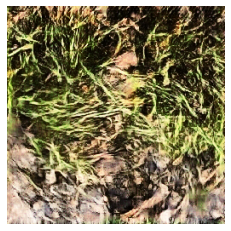

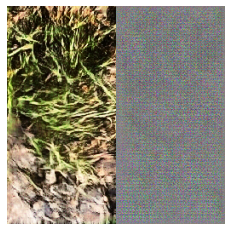

In [42]:
for left, right in train_dataset.take(1):
  generate_images(generator, left, right, plotting = True)

## Define the train step
Save losses to tensorboard.

In [39]:
@tf.function
def train_step(left, right, epoch):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(left, training=True)

    disc_real_output = discriminator([left, right], training=True)
    disc_generated_output = discriminator([left, gen_output], training=True)

    gen_gan_loss = generator_loss(disc_generated_output, gen_output)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)
    
    generator_gradients = gen_tape.gradient(gen_gan_loss,
                                          generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)
    
  
  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=epoch)
    tf.summary.scalar('disc_loss', disc_loss, step=epoch)

## Define the fit function
Show one prediction for the random image per epoch. Create basic interface (the interface might not work well if using tensorflow.2). Create checkpoints with the default interval and save the last epoch as well. 

# ADD SAVING EACH 50TH EPOCH

In [40]:
def fit(train_ds, epochs):
  for epoch in range(epochs):
    start = time.time()

    display.clear_output(wait=True)

    for left, right in train_ds.take(1):
      generate_images(generator, left, epoch = epoch, save = True)
    print("Epoch: ", epoch)

    # Train
    for n, (left, right) in train_ds.enumerate():
      print('.', end='')
      if (n+1) % 100 == 0:
        print()
      train_step(left, right, epoch)
    print()

    # saving (checkpoint) the model every 20 epochs
    if (epoch + 1) % 20 == 0:
      checkpoint.save(file_prefix=checkpoint_prefix)

    print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                        time.time()-start))
  checkpoint.save(file_prefix=checkpoint_prefix)

## Initiate tensorboard to view the losses from the runs

In [46]:
%load_ext tensorboard

In [47]:
%tensorboard --logdir {log_dir} --host localhost --port 6162

Reusing TensorBoard on port 6162 (pid 14792), started 1 day, 1:11:51 ago. (Use '!kill 14792' to kill it.)

## Fit the model

In [ ]:
fit(train_dataset, EPOCHS)

Epoch:  179


## Load the checkpoint
By default, the latest checkpoint is loaded. Else, set latest = False and specify the number of the checkpoint.

In [44]:
def load_ckpt(latest = True, number = 1):
  if latest:
    checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))
  else:
    checkpoint.restore('training_checkpoints_gan202/ckpt-' + str(number))

In [45]:
load_ckpt(False, 13)

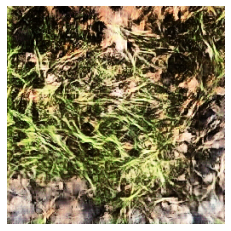

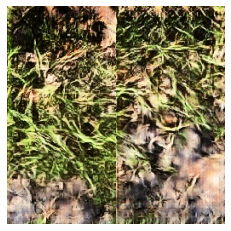

In [172]:
for left, right in train_dataset.take(1):
  generate_images(generator, left, right, plotting = True)

In [173]:
generated = []
original = []
for left, right in train_dataset.take(1):
  #generate_images(generator, left, save = False, plotting = True)
  prediction = generator(left, training = True)
  image1 = tf.concat([left[0], prediction[0]], 1)
  image2 = tf.concat([left[0], right[0]], 1)
  image1 = image1 * 0.5 + 0.5
  image2 = image2 * 0.5 + 0.5
  generated.append(image1)
  original.append(image2)

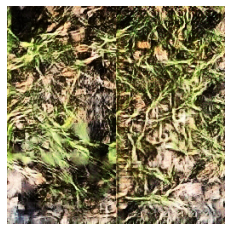

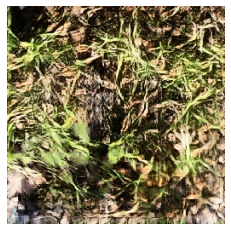

In [174]:
plt.imshow(generated[0])
plt.axis('off')
plt.show()
plt.imshow(original[0])
plt.axis('off')
plt.show()

In [175]:
lol = []
for col in range(256):
  xy = []
  for row in range(255):
    xy.append(abs(original[0][row] - original[0][row + 1])[col])
  lol.append(xy)
lol = np.array(lol)

In [177]:
lol1 = []
for col in range(256):
  xy = []
  for row in range(255):
    xy.append(abs(generated[0][row] - generated[0][row + 1])[col])
  lol1.append(xy)
lol1 = np.array(lol1)

In [193]:
lol[0].shape

(255, 3)

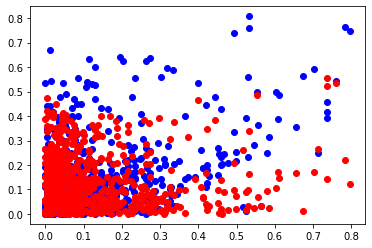

In [197]:
fig = plt.figure()
ax1 = fig.add_subplot(111)

ax1.scatter(lol[127], lol[128], c='b')
ax1.scatter(lol1[127], lol1[128], c='r')
plt.show()

In [146]:
rar = []
for row in range(255):
  rar.append(abs(generated[0][row] - original[0][row])[128])
rar = np.array(rar)

In [147]:
np.max(rar)

0.81774807

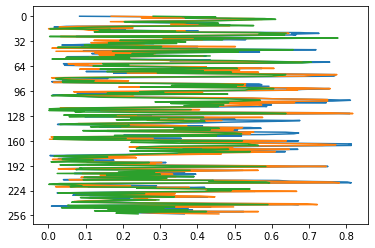

In [150]:
plt.plot(rar, range(255))
plt.gca().invert_yaxis()
plt.yticks(np.arange(0, 257, step = 32))
plt.show()

In [81]:
b = []
d = []
for i in range(255):
  a = np.mean([original[0][i], original[0][i+1]], axis = 0)
  c = np.mean([generated[0][i], generated[0][i+1]], axis = 0)
  b.append(np.sum(a, axis = 0))
  d.append(np.sum(c, axis = 0))
b = np.array(b)
d = np.array(d)

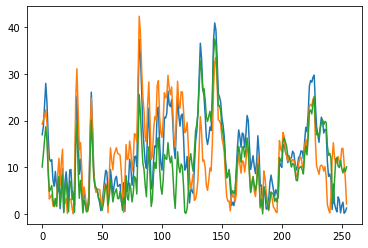

In [82]:
plt.plot(abs(b - d))

In [74]:
d

array([[148.59227 , 129.6654  ,  92.564026],
       [151.69563 , 132.63742 ,  97.06692 ],
       [166.01147 , 145.21472 , 109.17263 ],
       [163.90369 , 141.7834  , 106.67015 ],
       [136.04225 , 116.30699 ,  83.52141 ],
       [123.13681 , 104.106346,  72.86172 ],
       [130.13348 , 112.093475,  80.20813 ],
       [132.4369  , 114.915924,  83.609634],
       [132.56569 , 113.1541  ,  82.660995],
       [129.06635 , 110.40615 ,  78.15538 ],
       [123.8024  , 107.121864,  71.57745 ],
       [127.846146, 110.20257 ,  72.949585],
       [123.67667 , 108.09481 ,  69.57717 ],
       [115.76347 , 103.71013 ,  64.69753 ],
       [115.57345 , 103.203064,  65.29481 ],
       [114.941605, 101.410545,  65.40072 ],
       [112.02517 ,  98.40453 ,  64.56115 ],
       [102.456665,  90.3552  ,  57.04806 ],
       [ 99.88012 ,  87.71639 ,  54.410168],
       [104.761505,  91.651596,  57.882034],
       [106.43827 ,  94.220665,  58.301304],
       [116.83968 , 105.34317 ,  65.77948 ],
       [12

In [51]:
b = []
for i in range(255):
  a = np.mean([smth[0][i], smth[0][i+1]], axis = 0)
  b.append(np.sum(a, axis = 0))
b = np.array(b)

In [53]:
b

array([[ -57.012592  ,  -86.938034  , -144.74539   ],
       [ -63.66946   ,  -94.83876   , -148.46085   ],
       [ -46.371918  ,  -85.90948   , -136.68092   ],
       [ -46.706326  ,  -85.90792   , -136.6198    ],
       [ -82.991905  , -116.06075   , -162.5238    ],
       [ -94.42894   , -130.2622    , -169.32819   ],
       [ -79.681     , -115.40622   , -154.90659   ],
       [ -69.75727   , -101.28255   , -143.686     ],
       [ -69.8756    , -100.984024  , -142.21094   ],
       [ -72.42937   , -101.74565   , -142.55026   ],
       [ -70.88748   ,  -94.35474   , -140.86252   ],
       [ -70.60102   ,  -92.190796  , -142.78117   ],
       [ -81.53776   , -101.30996   , -151.85677   ],
       [ -94.643036  , -114.12372   , -161.5768    ],
       [-100.59942   , -118.54586   , -164.33708   ],
       [-104.13066   , -120.762505  , -165.2428    ],
       [-108.96419   , -126.59941   , -168.65723   ],
       [-112.73815   , -128.16083   , -171.828     ],
       [-111.0646    , -127.

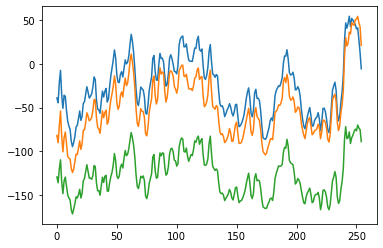

In [100]:
plt.figure()
#plt.yticks(np.arange(0, 1.01, step = 0.1))
#plt.xticks(np.arange(1, 8, step = 1))
plt.plot(b)